# <center> Практические задания по цифровой обработке сигналов </center>
# <center> Первая лабораторная работа </center>


В данной работе Вы познакомитесь с основными методами работы с аудиоданными в Python. Разбересь в том, как работает свертка, и примените пару интересных фильтров.

# Задание 1. Работа с аудиофайлами в Python (1 балл)

## Теория

Звук - это аналоговый сигнал. То есть он является непрерывным по времени и по значениям. Для того, чтобы работать со звуком на цифровом устройстве, надо преобразовать его в цифровое представление. Для этого надо разделить непрерывный сигнал на промежутки времени (дискретизация сигнала) и разбить непрерывные значения на интервалы (квантование сигнала). Выбраные параметры дискретизации и квантования сигнала напрямую влияют на качество цифрового сигнала. 

<!-- 
## Практика

1. Что хранится в .wav файле? Как узнать параметры дискретизации и квантования .wav файла? 

2. Запишите аудиофайл со своим голосом. Загрузите его. Попробуйте поменять ему частоту дискретизации. Нарисуйте форму волны считанного файла. Воспроизведите полученные сигналы. При какой частоте дискретизации становится невозможно разобрать человеческую речь?   

3. Чем .wav отличается от других кодеков, например .mp3 или .ogg? -->


<!-- ### Подсказка

Записать цифровой сигнал можно при помощи, например, [Audacity](https://www.audacityteam.org) или [Adobe Audition](https://www.adobe.com/ru/products/audition.html). Для считывания файлов воспользуйтесь библиотекой [scipy](https://www.scipy.org) или [librosa](https://librosa.org/doc/latest/index.html). Для воспроизведения аудиофайла удобно использовать класс Audio из модуля IPython.display, а для отрисовки - matplotlib. -->

In [1]:
import matplotlib.pyplot as plt 
import numpy as np
%matplotlib inline
import scipy.signal
import scipy.io as sio
import os
import IPython.display as ipd

### 1. Что хранится в .wav файле? Как узнать параметры дискретизации и квантования .wav файла?

Wav формат хранит в себе несжатый оцифрованный сигнал. Т.е аналоговый сигнал, пропущенный через АЦП, без каких-либо изменений. 
Параметры wav формата можно узнать следующим образом: частота дискретизации равна отношению числа отсчетов к длительности сигнала; битность можно посчитать если узнать число уникальных значений отсчетов, взять от этого числа двоичный логарифм и округлить до большего целого.

Для наглядности рассмотрим в качестве примера аудиодорожку с названием bach_orig.wav из папки resources

In [2]:
sample_rate, data = sio.wavfile.read(os.path.join('./resources', 'bach_orig.wav'))
length = data.shape[0] / sample_rate
bit = np.ceil(np.log2(np.unique(data).shape[0])).astype("int")
print(f"Частота дискретизации = {sample_rate}Гц")
print(f"Число бит = {bit}")
print(f"Длина файла = {length:.1f}c")

Частота дискретизации = 44100Гц
Число бит = 14
Длина файла = 42.8c


А сам сигнал выглядит так

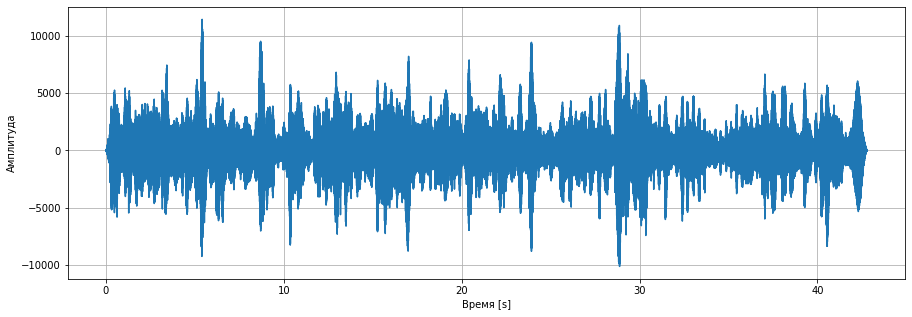

In [3]:
time = np.linspace(0., length, data.shape[0])
plt.figure(figsize=(15, 5))
plt.plot(time, data)
plt.xlabel("Время [s]")
plt.ylabel("Амплитуда")
plt.grid()
plt.show()

### 2. Запишите аудиофайл со своим голосом. Загрузите его. Попробуйте поменять ему частоту дискретизации. Нарисуйте форму волны считанного файла. Воспроизведите полученные сигналы. При какой частоте дискретизации становится невозможно разобрать человеческую речь?

**Подсказка**

Записать цифровой сигнал можно при помощи, например, [Audacity](https://www.audacityteam.org) или [Adobe Audition](https://www.adobe.com/ru/products/audition.html). Для считывания файлов воспользуйтесь библиотекой [scipy](https://www.scipy.org) или [librosa](https://librosa.org/doc/latest/index.html). Для воспроизведения аудиофайла удобно использовать класс Audio из модуля IPython.display, а для отрисовки - matplotlib.

In [4]:
sample_rate, voice = sio.wavfile.read(os.path.join('./resources', 'voice.wav'))
length = voice.shape[0] / sample_rate

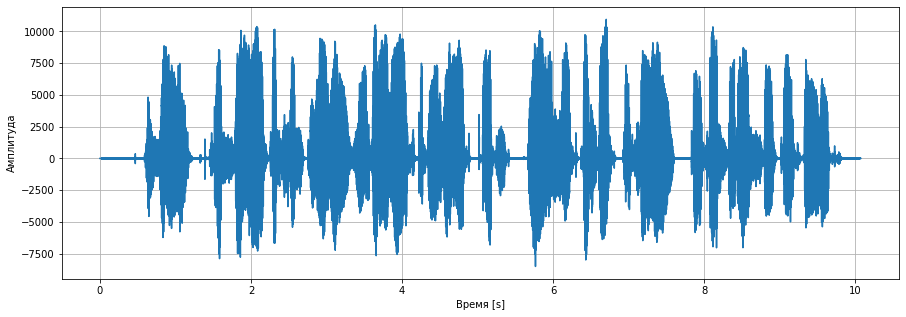

In [5]:
time = np.linspace(0., length, voice.shape[0])
plt.figure(figsize=(15, 5))
plt.plot(time, voice)
plt.xlabel("Время [s]")
plt.ylabel("Амплитуда")
plt.grid()
plt.show()

In [6]:
ipd.Audio(data=voice, rate=44100)

Изменим частоту дискретизации в два раза

In [7]:
ipd.Audio(data=voice, rate=22050)

Ага. Напоминает речь энта из Властелина Колец

Теперь уменьшим частоту дискретизации еще в два раза

In [8]:
ipd.Audio(data=voice, rate=11025)

Вроде еще можно разобрать речь

И еще в два раза...

In [9]:
ipd.Audio(data=voice, rate=5512)

Ну тут уже совсем невозможно

### 3. Чем .wav отличается от других кодеков, например .mp3 или .ogg?

Существует три основных класса аудиформатрв: форматы без сжатия, со сжатием без потерь и со сжатием с потерями.

wav принадлежит первому классу форматов. Такие форматы хранят данные без сжатия и кодирования, что влечет за собой большие размеры файла.

mp3 и ogg принадлежат третьему классу аудиоформатов. Такие форматы сжимают данные, пытаясь отбросить содержимое, которое не может уловить наш слух.

# Задание 2. Гармонические сигналы (1 балл)

## Теория
[Гармонические колебания](https://ru.wikipedia.org/wiki/Гармонические_колебания) -  колебания, при которых физическая величина изменяется с течением времени по гармоническому (синусоидальному/косинусоидальному) закону. 

В общем случае гармонические колебания задаются формулой:

$$y=A \cos(\omega t+\varphi_0)$$

где $А$ - это амплитуда, $\omega$ – циклическая частота (радиан/с), $\varphi$ - фаза (сдвиг), $t$ – время. 


In [10]:
# Сначала определим функцию для отрисовки сигнала с хорошим масштабом и сеткой
# Это поможет легче анализировать сигнал
def draw_signal(data, figsize=(14, 14)):
    plt.figure(figsize=figsize)
    plt.plot(data, linewidth=2)
    plt.minorticks_on()
    plt.xticks(np.arange(0, len(data), step=len(data)//10))
    plt.yticks(np.arange((data.min().round())//10*10, 
                         (data.max().round())//10*10+10, step=5))
    plt.grid(which='major',
        color = 'k', 
        linewidth = 1)
    plt.grid(which='minor', 
        color = 'k', 
        linestyle = ':')
    plt.show()

In [11]:
# Читаем данные с подготовленными сигналами
import pickle
with open("resources/data.pickle", "rb") as f:
    test_data = pickle.load(f)
# Теперь можно приступать к практике!

## Практика

Постройте графики трех сигналов a, b и c из test_data['task2']. Попробуйте подобрать коэффициенты для этих сигналов. Сгенерируйте сигналы (1000 отсчетов) с подобранными коэффициентами. Постройте графики сгенерированных сигналов и пройдите тест на схожесть с оригинальным.


Подсказка. Фаза, период и амплитуда сигнала - целочисленные. Для генерации пользуйтесь библиотекой numpy и функциями arange, sin, cos.

### Сигнал ***a***

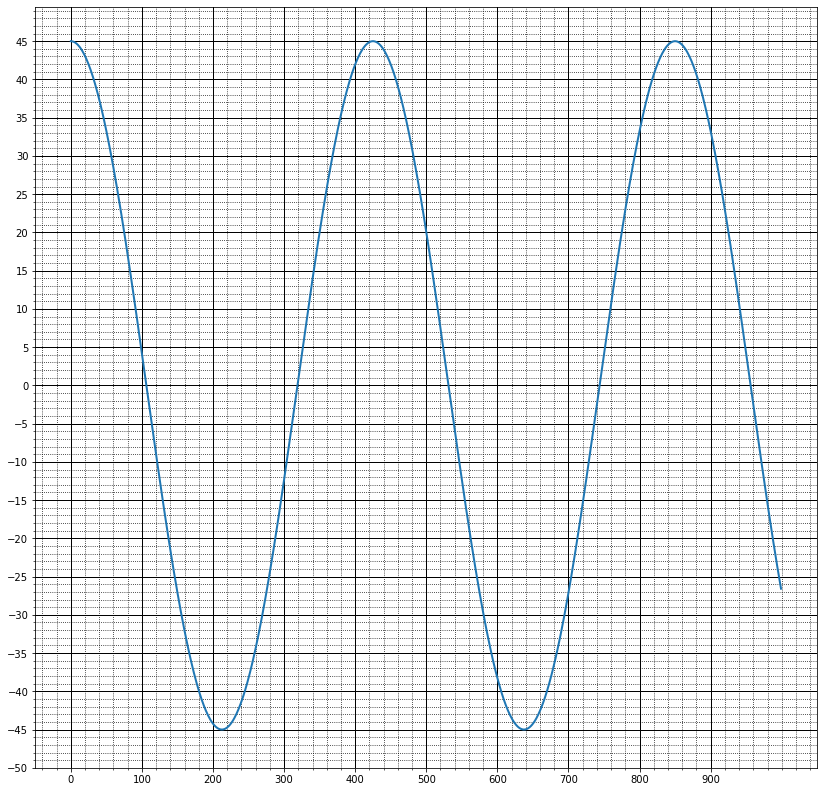

In [12]:
draw_signal(test_data['task2']['a'])

Из рисунка сразу видно, что амплитуда сигнала равна 45. Для того, чтобы определить период, а значит и частоту, сигнала измерим расстояние между одинаковыми точками периода и разделим на $2\pi$. Точнее всего это делать на пересечении сигнала с осью абсцисс. Давайте увеличим изображение и посмотрим на координаты точек пересечения

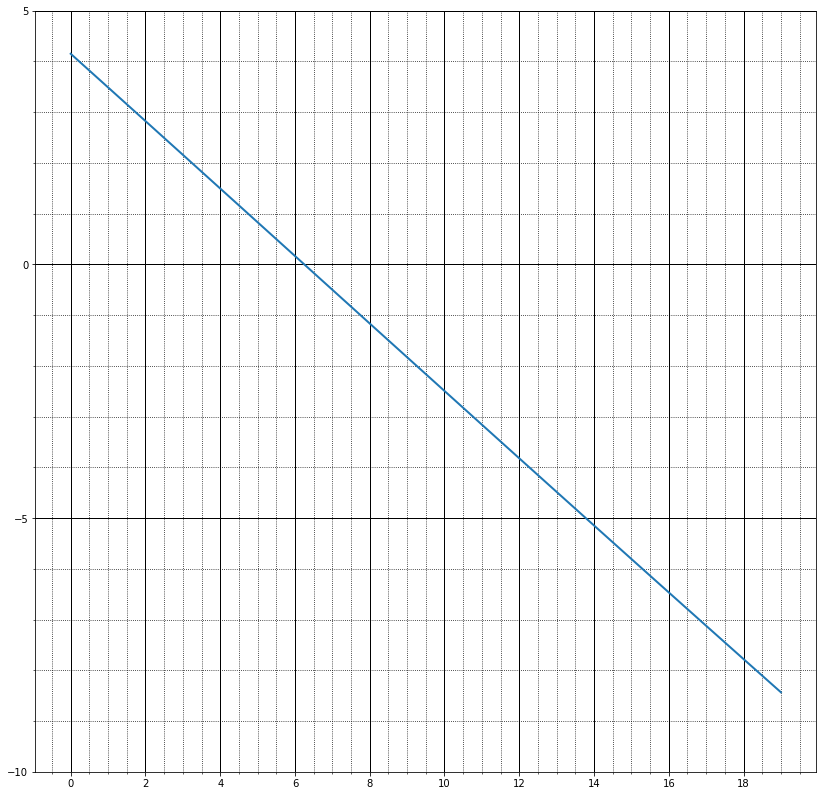

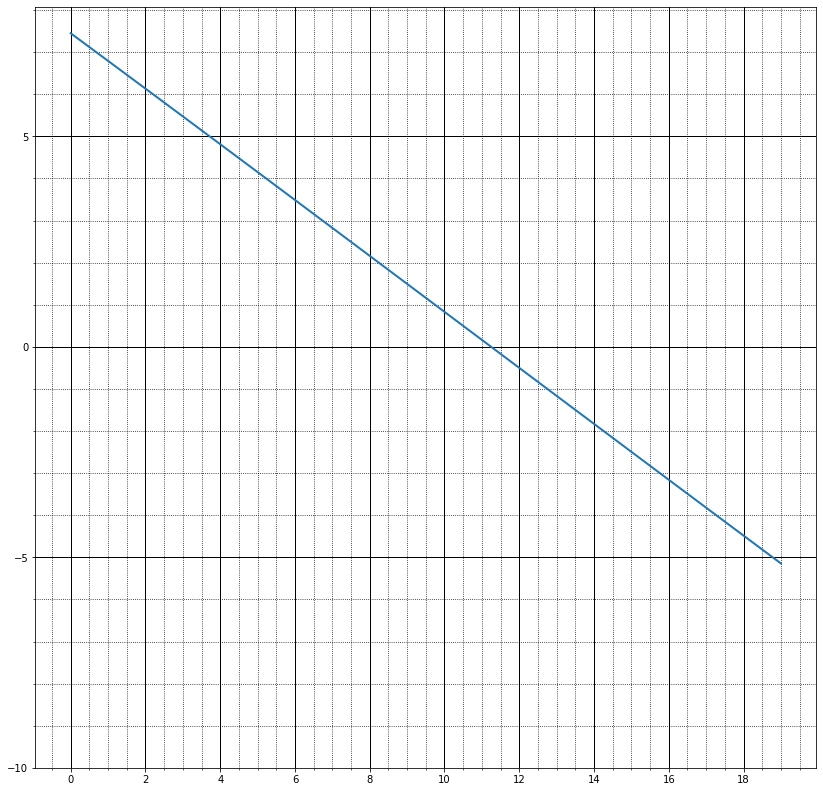

In [13]:
draw_signal(test_data['task2']['a'][100:120]) #Пересечение рядом с точкой 100
draw_signal(test_data['task2']['a'][520:540]) #Пересечение рядом с точкой 530

Отсюда видно, что первое пересечение происходит в точке $t_1 = 106.25$, а второе в точке $t_2 = 531.25$. Значит искомый преиод $T$ равен $T = t_2 - t_1 = 531.25 - 106.25 = 425$

Теперь зная период мы можем посчитать и фазу $\varphi$. Мы уже знаем первую точку, в которой наш сигнал равен нулю это точка $t_1 = 106.25$.
$$
Acos(\omega t_1 + \varphi) = 0 \Rightarrow \frac{2\pi}{T}t_1 + \varphi \Rightarrow \varphi = \frac{\pi}{2} - \frac{2\pi}{T}t_1 = \frac{\pi}{2} - \frac{2\pi}{425}106.25 = 0
$$

Значит фаза равна нулю.

In [14]:
a = 45*np.cos(2 * np.pi / 425 * np.arange(1000))

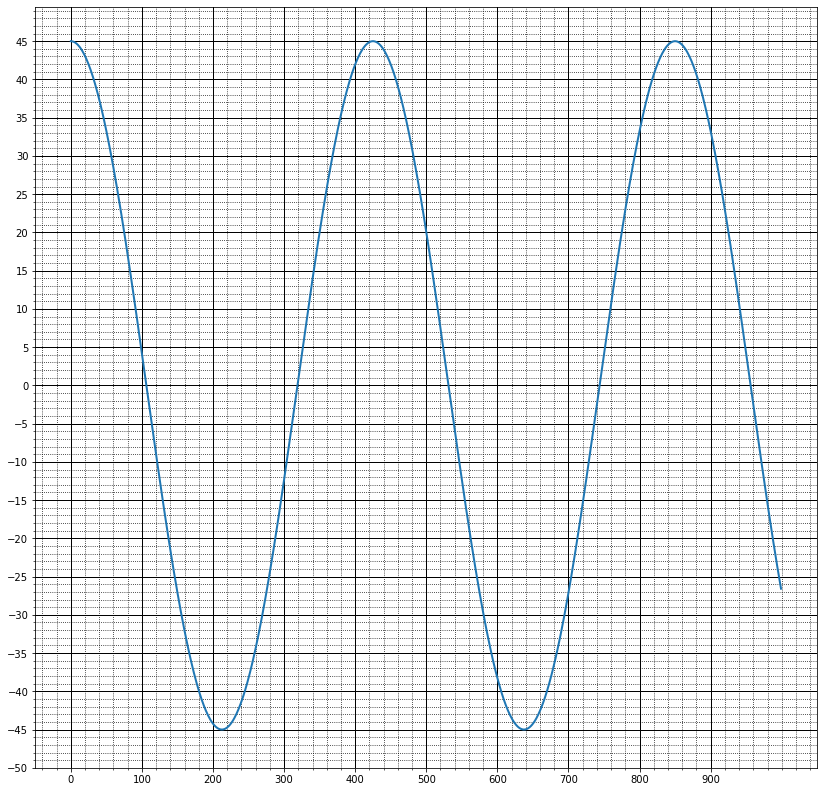

In [15]:
draw_signal(a)

In [16]:
assert len(a) == 1000
assert np.allclose(a, test_data["task2"]["a"], atol=1)
print("Ok!")

Ok!


**Подобранные коэффициенты для сигнала 'a':**
$$b = A\cos(\omega t + \varphi)$$

1. Амплитуда - $A= 45$

2. Угловая частота ($ \displaystyle\omega =\frac{2\pi}{T}) = \frac{2\pi}{425}$

3. Фаза - $\varphi= 0$

### Сигнал ***b***

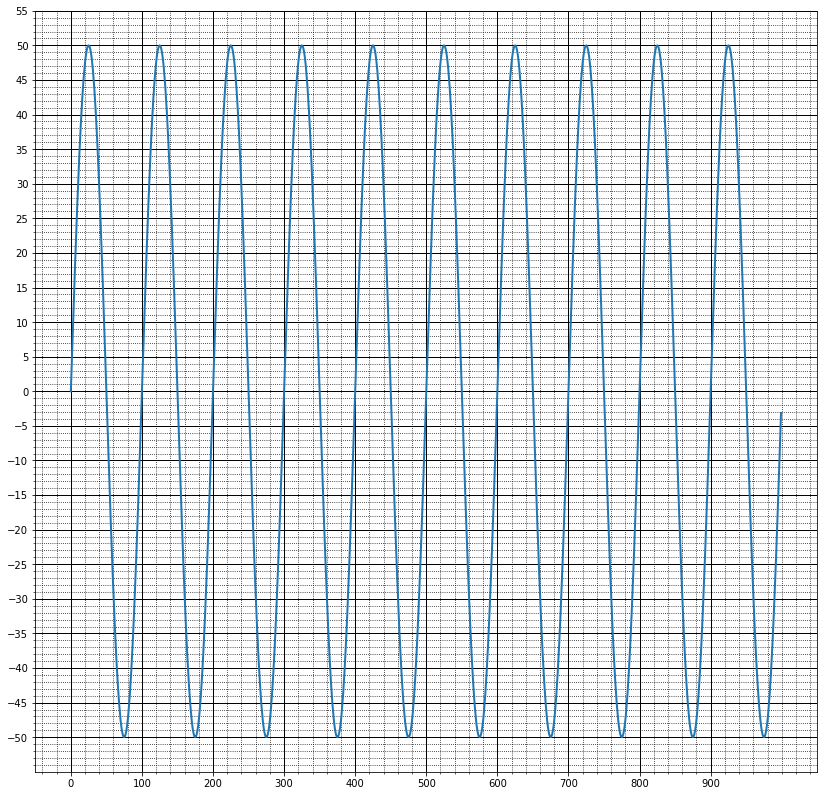

In [17]:
draw_signal(test_data['task2']['b'])

Видно, что сигнал хорошо описывается синусом. Проделаем тот же алгоритм, что и для первого сигнала.
В результате получаем:

**Подобранные коэффициенты для сигнала 'b':**
$$b = A\sin(\omega t + \varphi)$$

1. Амплитуда - $A= 50$

2. Угловая частота ($ \displaystyle\omega =\frac{2\pi}{T}) = \frac{2\pi}{100}$

3. Фаза - $\varphi  = 0$

In [18]:
b = 50*np.sin(2 * np.pi / 100 * np.arange(1000))

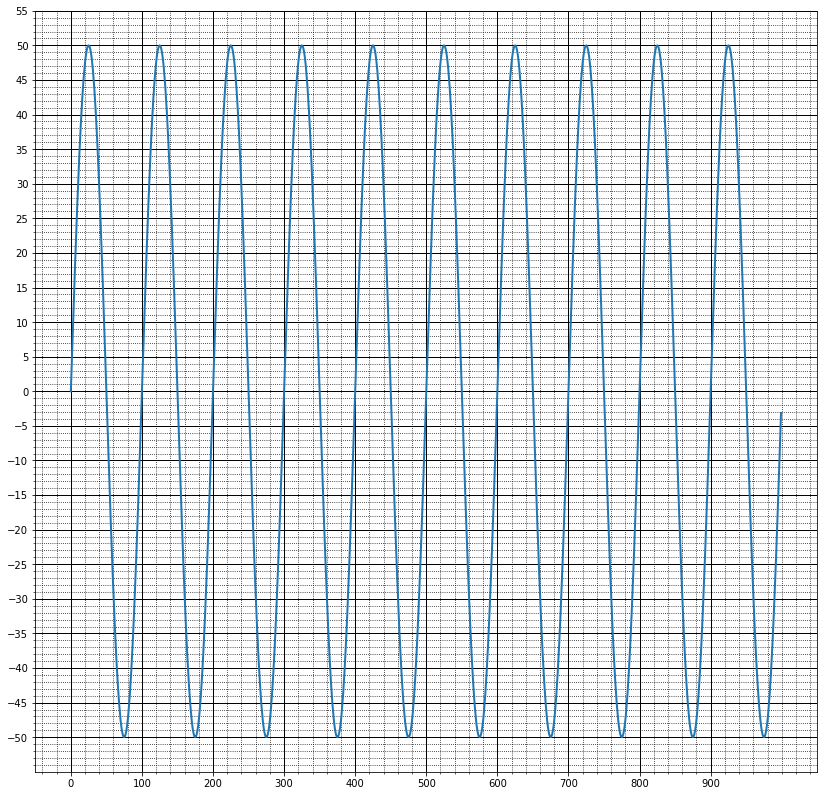

In [19]:
draw_signal(b)

In [20]:
assert len(b)== 1000
assert np.allclose(b, test_data["task2"]["b"], atol=1)
print("Ok!")

Ok!


### Сигнал ***c***

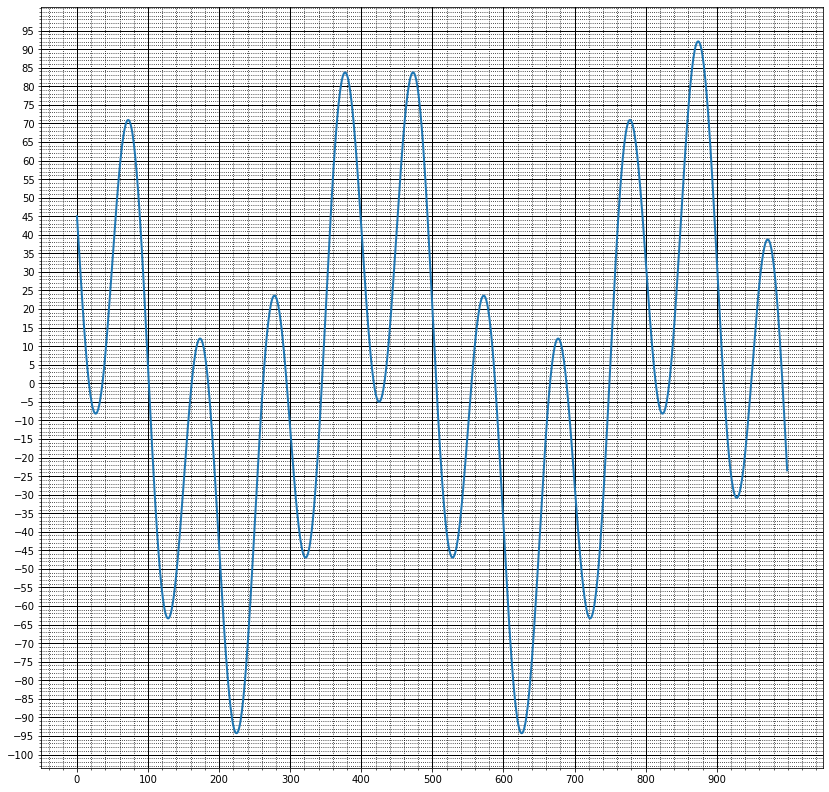

In [21]:
draw_signal(test_data['task2']['c'])

Видно, что наш сигнал является разностью низкочастотного косинуса и высокочастотного синуса. 
$$c = A_1\cos(\frac{2\pi}{T_{cos}}t) - A_2\sin(\frac{2\pi}{T_{sin}}t)$$
Период синуса довольно хорошо прикидывается $T_{sin} = 100$. Также видно, что амплитуды обоих сигналов примерно равны 50. Дальше будем прикидывать период косинуса, возьмем для начала $T_{cos} = 400$

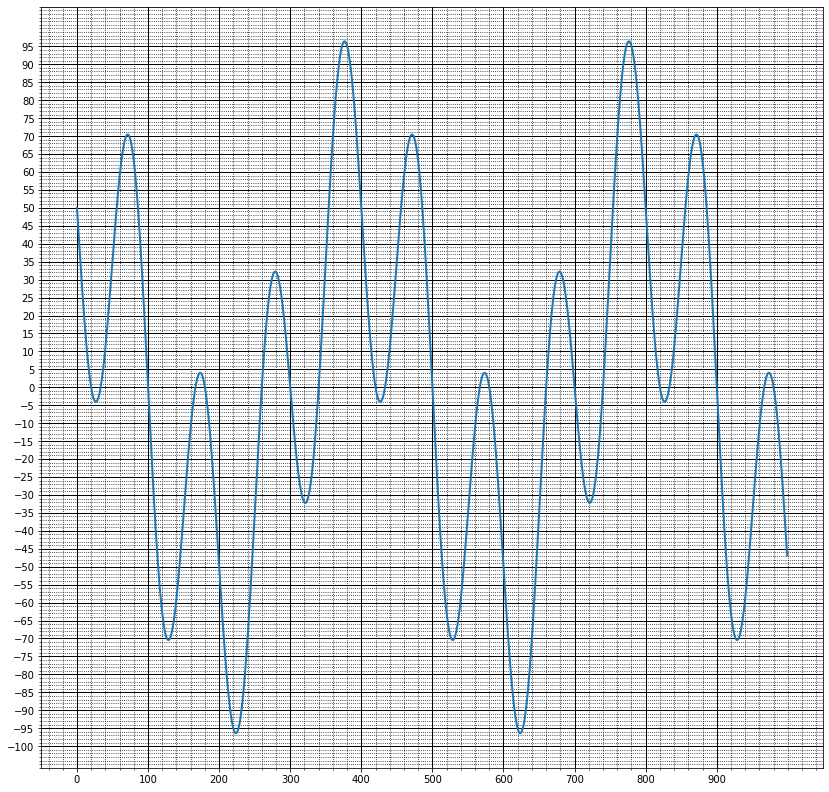

In [22]:
c = 50*np.cos(2 * np.pi / 400 * np.arange(1000)) - 50*np.sin(2 * np.pi / 100 * np.arange(1000))
draw_signal(c)

Ага, вроде похоже, но не угадали с периодом косинуса. Возьмем $T_{cos} = 450$

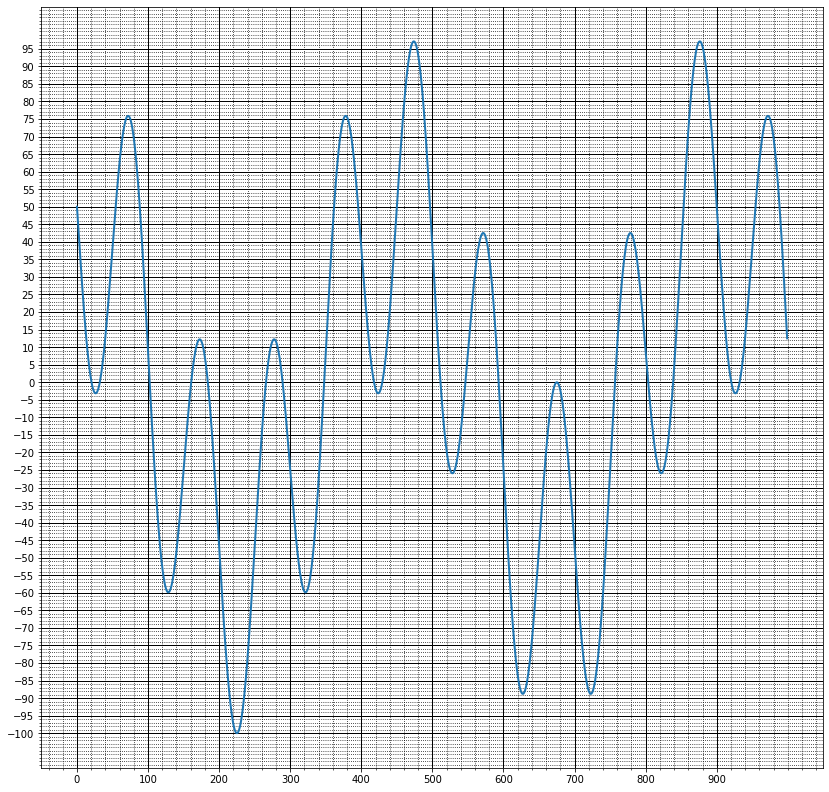

In [23]:
c = 50*np.cos(2 * np.pi / 450 * np.arange(1000)) - 50*np.sin(2 * np.pi / 100 * np.arange(1000))
draw_signal(c)

Так так, опять промахнулись... Возмем наконец Возьмем $T_{cos} = 425$

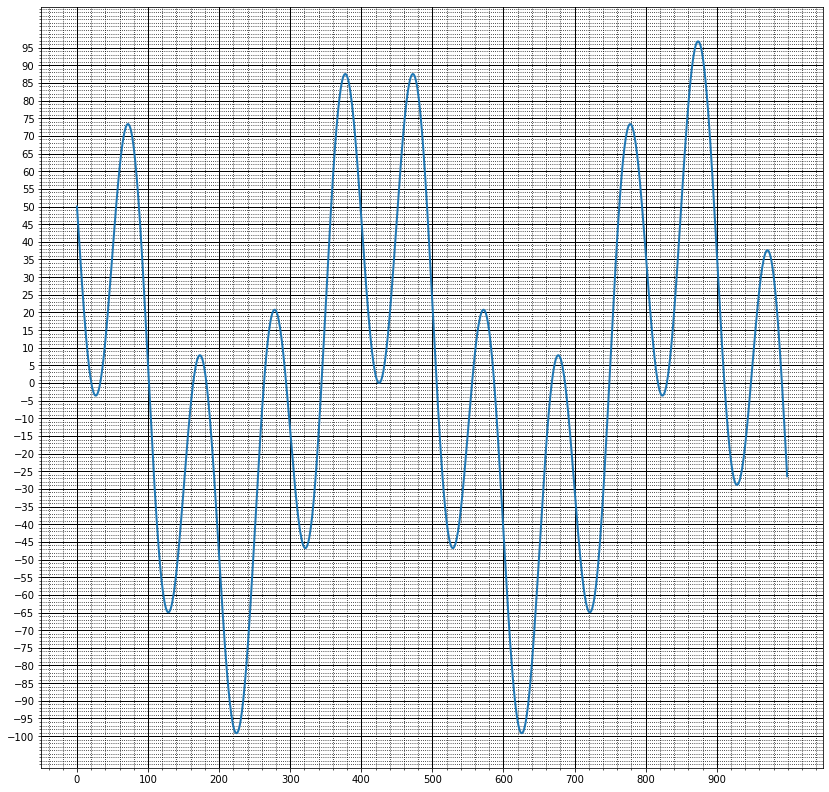

In [24]:
c = 50*np.cos(2 * np.pi / 425 * np.arange(1000)) - 50*np.sin(2 * np.pi / 100 * np.arange(1000))
draw_signal(c)

Ого, очень похоже! Но что-то не так с амплитудами. Тут можно заметить, что эти сигналы очень похожи на наши первые два. Давайте их и попробуем. Т.е вычтем из первого второй:

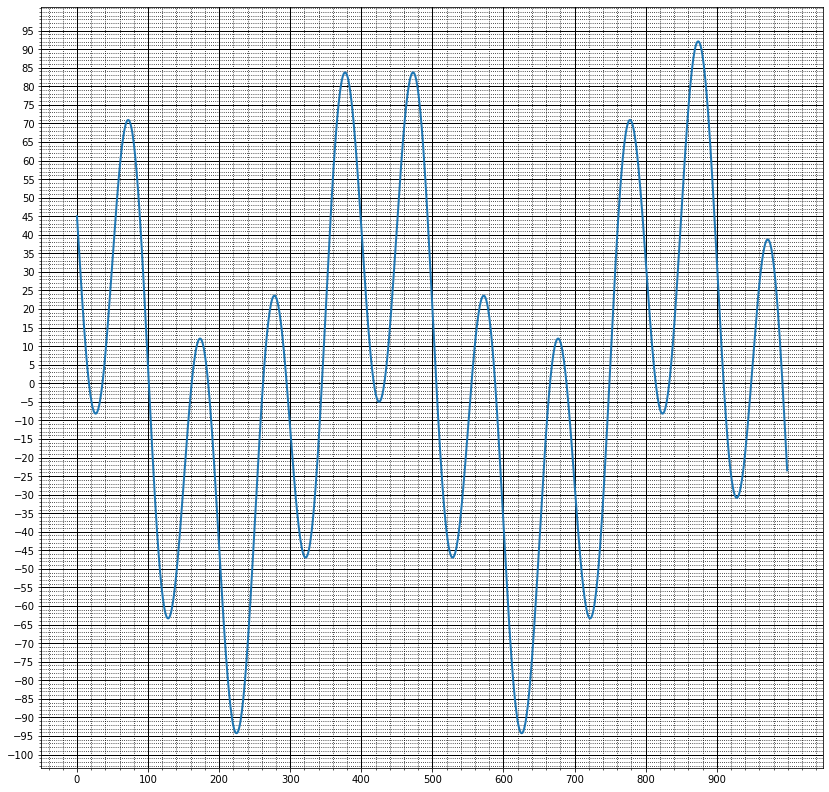

In [25]:
c = a - b
draw_signal(c)

Красота!

In [26]:
assert len(c)== 1000
assert np.allclose(c, test_data["task2"]["c"], atol=1)
print("Ok!")

Ok!


**Подобранные коэффициенты для сигнала 'c':**

$$c = A_1\cos(\frac{2\pi}{T_{cos}}t) - A_2\sin(\frac{2\pi}{T_{sin}}t)$$

1. Амплитуда - $A_1= 45, A_2 = 50$

2. Угловая частота $ \displaystyle\omega_{cos} =\frac{2\pi}{T_{cos}} = \frac{2\pi}{425}, \omega_{sin} =\frac{2pi}{T_{sin}} = \frac{2\pi}{100}$

3. Фаза - $\varphi = 0$

# Задание 3. Свертка (3 балла)

## Теория
Одна из наиболее частых операций, которая выполняется при обработке сигналов, это свёртка. Свёртка имеет много различных применений, например, с ее помощью можно убрать из сигнала шумы или применить к сигналу эффект эхо.


Свёртка — это математическая операция, применённая к двум функциям f и g и порождающая третью функцию. Операцию свёртки можно интерпретировать как «схожесть» одной функции с отражённой и сдвинутой копией другой.  Другими словами, преобразование свёртки однозначно определяет выходной сигнал y(t) для установленного значения входного сигнала x(t) при известном значении функции импульсного отклика системы h(t).

<!-- ![Convolution](resources/Convolution_of_box_signal_with_itself2.gif "Convolution") -->
![Convolution](resources/Convolution_of_box_signal_with_itself2.gif "Convolution")

Формула свёртки:
$$y_t=\frac{1}{2} \int_0^T x(\tau)h(t-τ)dτ$$
где $\tau$  - длительность импульсной переходной характеристики.

## Практика
Реализуйте операцию свёртки. Сравните её с существующей реализацией scipy.signal.convolve. Постройте графики фильтра, исходного сигнала и результата свертки.

In [27]:
def convolve(in1, in2):

    if len(in2) > len(in1):
        in1, in2 = in2, in1
        
    n1 = len(in1)
    n2 = len(in2)
    x = [0]*(n1-1) + list(in2[::-1]) + [0]*(n1-1) 
    x = [x[i:i+n1] for i in range(n1+n2-2, -1, -1)]
    res = np.array(x) @ np.array(in1)
    return res

In [28]:
def test_convolve(a, b, print_debug=False):
    my_result = convolve(a, b)
    scipy_result = scipy.signal.convolve(a, b, method='direct')
    if print_debug:
        print(f"Your result {my_result}")
        print(f"Scipy result {scipy_result}")
    assert np.allclose(my_result, scipy_result), f"Test {a} conv {b} failed"
    print("Ok!")

In [29]:
a = np.repeat([0,1,0], 10)
b = np.array([0,1,2,3,2,1,0])

In [30]:
test_convolve(a, b, print_debug=False)

Ok!


### Нарисуйте результат свертки a и b

Сигнал **а**

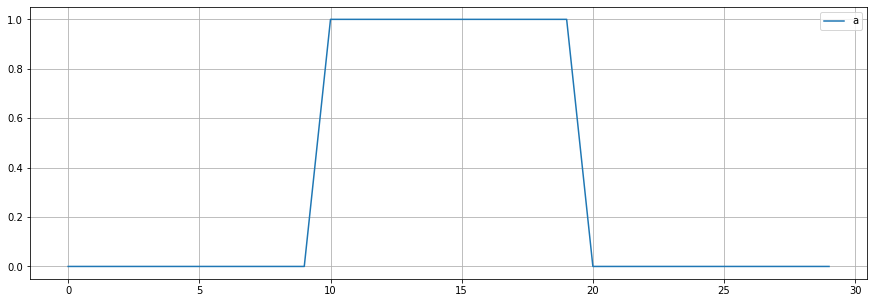

In [31]:
plt.figure(figsize=(15, 5))
plt.plot(a, label='a')
plt.legend()
plt.grid()

Сигнал **b**

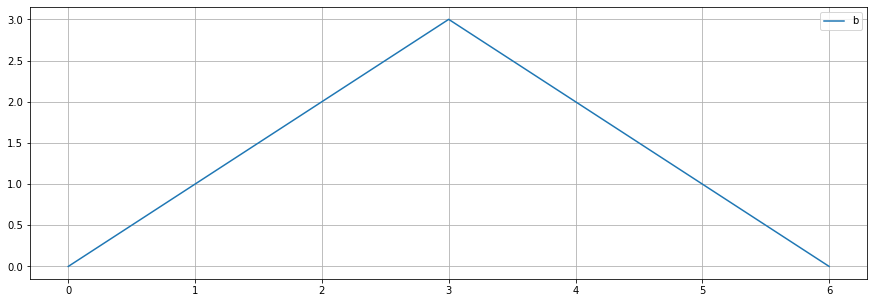

In [32]:
plt.figure(figsize=(15, 5))
plt.plot(b, label='b')
plt.legend()
plt.grid()

Свертка **a** и **b**

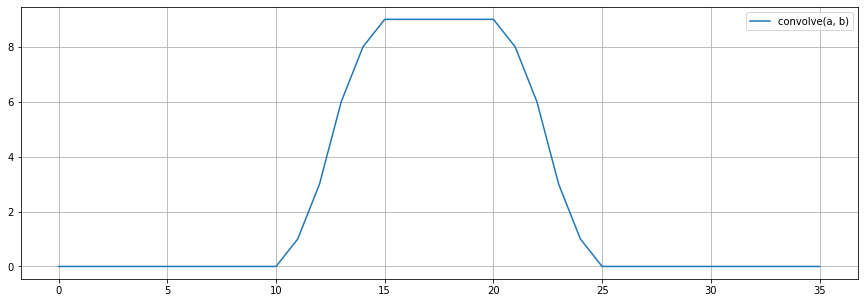

In [33]:
conv = convolve(a, b)
plt.figure(figsize=(15, 5))
plt.plot(conv, label='convolve(a, b)')
plt.legend()
plt.grid()

Все 3 графика на одной картинке:

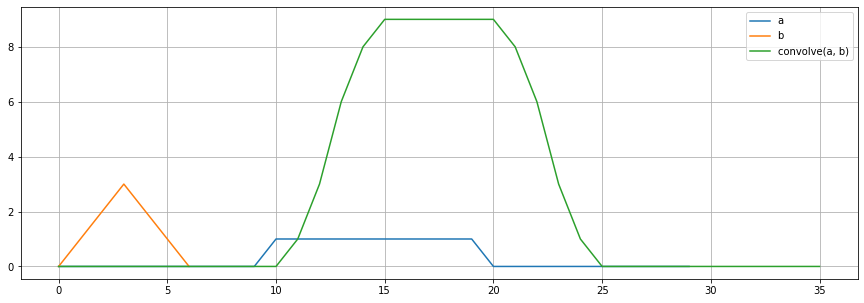

In [34]:
plt.figure(figsize=(15, 5))
plt.plot(a, label='a')
plt.plot(b, label='b')
plt.plot(conv, label='convolve(a, b)')
plt.legend()
plt.grid()

# Задание 4. * Алгоритм Карплуса-Стронга 

Реализуйте  [Алгоритм Карплуса-Стронга](https://en.wikipedia.org/wiki/Karplus%E2%80%93Strong_string_synthesis). В качестве фильтра используйте усреднитель двух смежных отсчетов. Проверьте результат. 

Отрисуйте и воспроизведите полученный сигнал. На что влияют параметры генерации? Попробуйте имитировать звучание разных струн гитары.

In [35]:
def karplus_strong(noise, N, alpha = 1):
    # Noise - input
    # N - number of samples to generate
    # return y - generated signal based on Noise 
    # YOUR CODE HERE
    M = 1
    y = list(noise)
    for i in range(M):
        y.append(alpha * noise[i] / 2)
    for i in range(M, N - len(noise)):
        y.append(alpha * (y[i] + y[i-1]) / 2)
    return y

    

In [36]:
np.random.seed(seed=1)
sample_rate = 44100 
frequency = 82.41
sec = 2
gen_len = sample_rate * sec
noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency))) # [-1, 1]

gen_wav = karplus_strong(noise, gen_len)
assert np.allclose(gen_wav[:len(noise)], noise), "Generated signal must starting with noise"
assert np.allclose(gen_wav[len(noise)], (noise[0])/2), "Out of range samples eq 0."
assert np.allclose(gen_wav[len(noise)+1: 2*len(noise)], (noise[:-1] + noise[1:])/2), \
    "Bad requrent rule( 1 iteration)"
assert np.allclose(gen_wav[2*len(noise)], (noise[0]/2 + noise[-1])/2), \
    "Bad requrent rule( 2 iteration)"
assert np.allclose(gen_wav[2*len(noise)+2: 3*len(noise)], \
                   (((noise[:-1] + noise[1:])/2)[:-1] + ((noise[:-1] + noise[1:])/2)[1:])/2), \
    "Bad requrent rule( 3 iteration)"
print('All Ok!')

All Ok!


### Попробуем покрутить параметры генерации

Сгенерируем гитарные ноты:

In [37]:
frequency = [82.41, 110.00, 146.83, 196.00, 246.96, 329.63]
sec = 2
sample_rate = 44100 
gen_len = sample_rate * sec

In [38]:
#Ми
noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency[0])))
E = karplus_strong(noise, gen_len)
ipd.Audio(data=E, rate=sample_rate)

In [39]:
#Ля
noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency[1])))
A = karplus_strong(noise, gen_len)
ipd.Audio(data=A, rate=sample_rate)

In [40]:
#Ре
noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency[2])))
D = karplus_strong(noise, gen_len)
ipd.Audio(data=D, rate=sample_rate)

In [41]:
#Соль
noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency[3])))
g = karplus_strong(noise, gen_len)
ipd.Audio(data=g, rate=sample_rate)

In [42]:
#Си
noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency[4])))
b = karplus_strong(noise, gen_len)
ipd.Audio(data=b, rate=sample_rate)

In [43]:
#Ми
noise = (2 * np.random.uniform(-1, 1, int(sample_rate/frequency[5])))
e = karplus_strong(noise, gen_len)
ipd.Audio(data=e, rate=sample_rate)

# Добавим немого Баха

In [44]:
def ks(f, s = 1):
    np.random.seed(seed=1)
    sample_rate = 44100
    a = 1
    M = 2
    noise = (2 * np.random.uniform(-1, 1, int(sample_rate/f)))
    N = int(sample_rate * s)
    
    y = list(noise)
    for i in range(M):
        y.append(a*noise[i] / 2)
        
    for i in range(M, N - len(noise)):
        y.append(a*(y[i] + y[i-1]) / 2)
    return y

In [45]:
#Первый такт
def bar1():
    a1 = np.array(ks(130.82)) + np.array(ks(261.63)) + np.array(ks(329.63))
    a2 = np.array(ks(130.82))
    a3 = np.array(ks(123.48)) + np.array(ks(261.63)) + np.array(ks(329.63))
    a4 = np.array(ks(123.48))
    return list(a1) + list(a2) + list(a3) + list(a4)
#Второй такт
def bar2():
    a1 = np.array(ks(110)) + np.array(ks(261.63)) + np.array(ks(329.63))
    a2 = np.array(ks(110))
    a3 = np.array(ks(98)) + np.array(ks(261.63)) + np.array(ks(329.63))
    a4 = np.array(ks(98))
    return list(a1) + list(a2) + list(a3) + list(a4)
#Третрий такт
def bar3():
    a1 = np.array(ks(87.31)) + np.array(ks(261.63)) + np.array(ks(329.63))
    a2 = np.array(ks(87.31, s = 0.5)) + np.array(ks(261.63, s = 0.5)) + np.array(ks(440, s = 0.5))
    a3 = np.array(ks(349.23, s = 0.5))
    a4 = np.array(ks(92.5, s = 0.5)) + np.array(ks(220, s = 0.5)) + np.array(ks(293.66, s = 0.5))
    a5 = np.array(ks(261.63, s = 0.5))
    a6 = np.array(ks(87.31, s = 0.5)) + np.array(ks(246.96, s = 0.5))
    a7 = np.array(ks(261.63, s = 0.5))
    return list(a1) + list(a2) + list(a3) + list(a4) + list(a5) + list(a6) + list(a7)
#Четвертый такт
def bar4():
    a1 = np.array(ks(98)) + np.array(ks(196)) + np.array(ks(246.96))
    a2 = np.array(ks(98))
    a3 = np.array(ks(87.31)) + np.array(ks(196)) + np.array(ks(246.96))
    a4 = np.array(ks(220, s = 0.5))
    a5 = np.array(ks(196, s = 0.5))
    return list(a1) + list(a2) + list(a3) + list(a4) + list(a5)
#Пятый такт
def bar5():
    a1 = np.array(ks(164.81)) + np.array(ks(246.96)) + np.array(ks(293.66)) + np.array(ks(392))
    a2 = np.array(ks(164.81))
    a3 = np.array(ks(164.81)) + np.array(ks(233.08)) + np.array(ks(293.66)) + np.array(ks(392))
    a4 = np.array(ks(164.81))
    return list(a1) + list(a2) + list(a3) + list(a4)
#Шестой такт
def bar6():
    a1 = np.array(ks(164.81)) + np.array(ks(233.08)) + np.array(ks(277.18)) + np.array(ks(392))
    a2 = np.array(ks(233.08, s = 0.5))
    a3 = np.array(ks(220, s = 0.5))
    a4 = np.array(ks(110, s = 0.5)) + np.array(ks(220, s = 0.5)) + np.array(ks(293.66, s = 0.5))
    a5 = np.array(ks(277.18, s = 0.5))
    a6 = np.array(ks(110, s = 0.5)) + np.array(ks(277.18, s = 0.5)) + np.array(ks(392, s = 0.5))
    a7 = np.array(ks(349.23, s = 0.5))
    return list(a1) + list(a2) + list(a3) + list(a4) + list(a5) + list(a6) + list(a7)
#Седьмой такт
def bar7():
    a1 = np.array(ks(147.83)) + np.array(ks(220)) + np.array(ks(293.66)) + np.array(ks(349.23))
    a2 = np.array(ks(147.83))
    a3 = np.array(ks(130.82)) + np.array(ks(220)) + np.array(ks(293.66)) + np.array(ks(349.23))
    a4 = np.array(ks(130.82))
    return list(a1) + list(a2) + list(a3) + list(a4)
#Восьмой такт
def bar8():
    a1 = np.array(ks(123.48, s = 0.5)) + np.array(ks(196, s = 0.5)) + np.array(ks(246.96, s = 0.5))
    a2 = np.array(ks(349.23, s = 0.5))
    a3 = np.array(ks(220, s = 0.5))
    a4 = np.array(ks(196, s = 0.5))
    a5 = np.array(ks(98, s = 0.5)) + np.array(ks(261.63, s = 0.5))
    a6 = np.array(ks(246.96, s = 0.5))
    a7 = np.array(ks(349.23, s = 0.5))
    a8 = np.array(ks(329.63, s = 0.5))
    return list(a1) + list(a2) + list(a3) + list(a4) + list(a5) + list(a6) + list(a7) + list(a8)
#Девятый такт
def bar9():
    a1 = np.array(ks(130.82)) + np.array(ks(261.63)) + np.array(ks(329.63))
    a2 = np.array(ks(130.82))
    a3 = np.array(ks(123.48)) + np.array(ks(261.63)) + np.array(ks(329.63))
    a4 = np.array(ks(123.48, s = 0.5)) + np.array(ks(369.99, s = 0.5))
    a5 = np.array(ks(392, s = 0.5))
    return list(a1) + list(a2) + list(a3) + list(a4) + list(a5)
#Десятый такт
def bar10():
    a1 = np.array(ks(110)) + np.array(ks(220)) + np.array(ks(261.63))
    a2 = np.array(ks(293.66, s = 0.5))
    a3 = np.array(ks(329, s = 0.5))
    a4 = np.array(ks(92.5)) + np.array(ks(220)) + np.array(ks(293.66))
    a5 = np.array(ks(92.5, s = 0.5))
    a6 = np.array(ks(261.63, s = 0.5))
    return list(a1) + list(a2) + list(a3) + list(a4) + list(a5) + list(a6)
#Одиннадцатый такт
def bar11():
    a1 = np.array(ks(98)) + np.array(ks(196)) + np.array(ks(246.96))
    a2 = np.array(ks(220, s = 0.5))
    a3 = np.array(ks(246.96, s = 0.5))
    a4 = np.array(ks(110)) + np.array(ks(220)) + np.array(ks(261.63))
    a5 = np.array(ks(92.5)) + np.array(ks(220))
    return list(a1) + list(a2) + list(a3) + list(a4) + list(a5)
#Двенадцатый такт
def bar12():
    a1 = np.array(ks(98, s = 0.5))
    a2 = np.array(ks(110, s = 0.5))
    a3 = np.array(ks(123.48, s = 0.5))
    a4 = np.array(ks(130.82, s = 0.5))
    a5 = np.array(ks(147.83, s = 0.5))
    a6 = np.array(ks(174.62, s = 0.5))
    a7 = np.array(ks(164.81, s = 0.5))
    a8 = np.array(ks(147.83, s = 0.5))
    return list(a1) + list(a2) + list(a3) + list(a4) + list(a5) + list(a6) + list(a7) + list(a8)

In [46]:
sound = bar1() + bar2() + bar3() + bar4() + bar5() + bar6() + bar7() + bar8() + bar9() + bar10() + bar11() + bar12()

In [47]:
ipd.Audio(data=sound, rate=sample_rate)

Визуализируем затухание амплитуды:

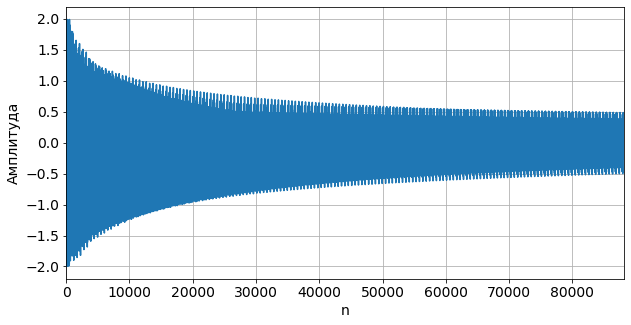

In [48]:
plt.figure(figsize=(10,5))
plt.xlabel('n', fontsize=14)
plt.ylabel('Амплитуда', fontsize=14)
plt.xlim(0, gen_len)
plt.plot(np.linspace(0, gen_len+1, gen_len), gen_wav)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.grid()

Визуализируйте затухание амплитуд гитарных нот:

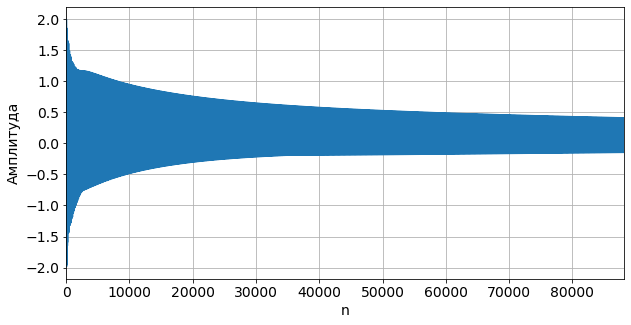

In [49]:
plt.figure(figsize=(10,5))
plt.xlabel('n', fontsize=14)
plt.ylabel('Амплитуда', fontsize=14)
plt.xlim(0, gen_len)
plt.plot(np.linspace(0, gen_len+1, gen_len), e)
plt.tick_params(axis='both', which='major', labelsize=14)
plt.grid()